<a href="https://colab.research.google.com/github/cweiqiang/wq.github.io/blob/main/Datacamp_Visualizing_Geospatial_Data_in_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Course Description
One of the most important tasks of a data scientist is to understand the relationships between their data's physical location and their geographical context. In this course you'll be learning to make attractive visualizations of geospatial data with the GeoPandas package. You will learn to spatially join datasets, linking data to context. Finally you will learn to overlay geospatial data to maps to add even more spatial cues to your work. You will use several datasets from the City of Nashville's open data portal to find out where the chickens are in Nashville, which neighborhood has the most public art, and more!

https://github.com/geopandas/geopandas/issues/901 to tackle using geopandas.sjoin (Spatial join via Geometry column), with installations below

In [2]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


In [3]:
cd /gdrive/MyDrive/Datacamp-Course-Slides/Visualizing-Geospatial-Data-in-Python

/gdrive/MyDrive/Datacamp-Course-Slides/Visualizing-Geospatial-Data-in-Python


In [4]:
%%time 
!apt update
!apt upgrade
!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirment
!apt install python3-rtree 

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease [1,581 B]
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:5 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Packages [770 kB]
Hit:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:8 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:10 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:11 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:13 http://security.ubuntu.com/ubuntu bionic-security/main amd64 Packages [2,765

In [5]:
!pip install geopandas==0.10.0
# Install descartes - Geopandas requirement
!pip install descartes 

     |████████████████████████████████| 1.0 MB 3.9 MB/s 
     |████████████████████████████████| 6.3 MB 50.8 MB/s 
     |████████████████████████████████| 16.7 MB 544 kB/s 


In [6]:
!pip install folium

In [7]:
import os
import geopandas as gpd

# Chapter 1: Building 2-layer maps : combining polygons and scatterplots

In this chapter, you will learn how to create a two-layer map by first plotting regions from a shapefile and then plotting location points as a scatterplot. See [Slides for Chapter 1 here](https://drive.google.com/file/d/1fbYNCL3dxdLIOeLYTyXZATA4Rl96ZfEX/view?usp=sharing).

## 1.1. Extracting longitude and latitude

A DataFrame named df has been pre-loaded. Complete the code to extract longitude and latitude to new, separate columns.

- Use a list comprehension to extract latitude to a new column called `lat`.

- Use a list comprehension to extract longitude to a new column called `lng`.

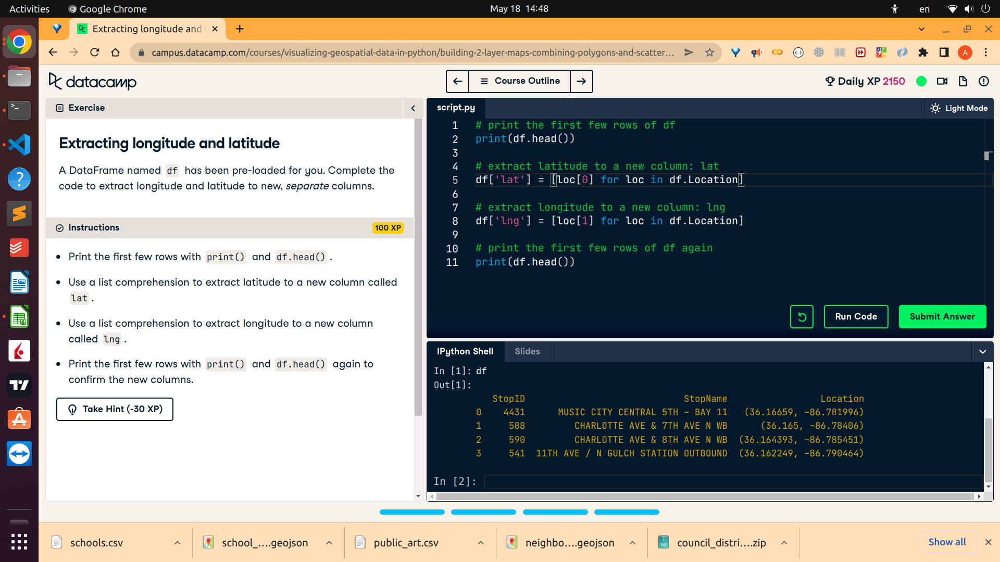

In [8]:
# # print the first few rows of df 
# print(df.head())

# # extract latitude to a new column: lat
# df['lat'] = [loc[0] for loc in df.Location] 
# #note that (x,y) is contained in a tuple

# # extract longitude to a new column: lng
# df['lng'] = [loc[1] for loc in df.Location]

# # print the first few rows of df again
# print(df.head())

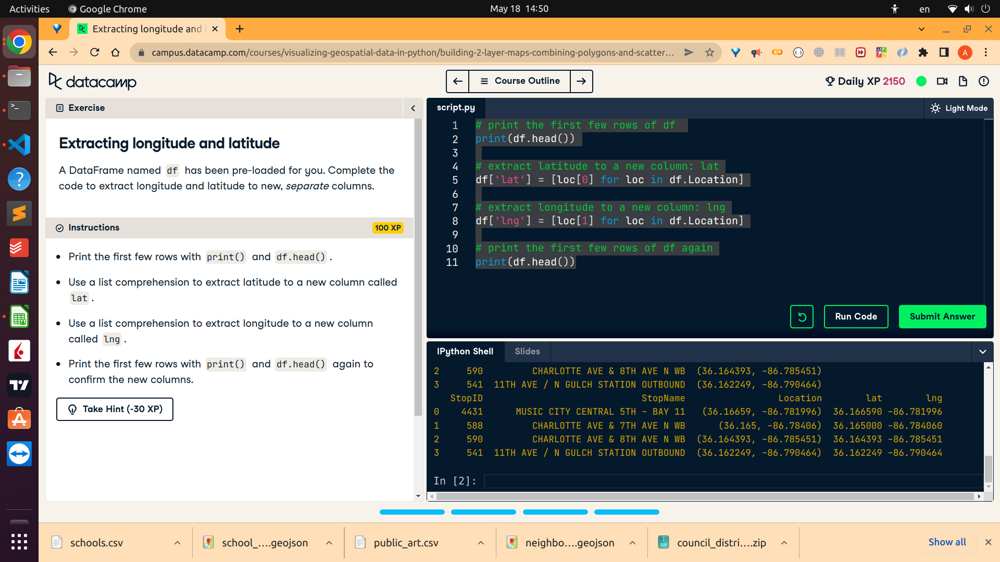

## 1.2. Plotting locations

Now you will create a scatterplot that shows where the Nashville chickens are!



---
- The path to the chicken dataset is in the variable chickens_path. Use the `read_csv` function of pandas to load it into a DataFrame called `chickens`.

- Use the `.head()` function to look at the first few rows.
Next add the x and y arguments to `plt.scatter()` to plot the locations of the Nashville chickens. Use the default marker and color options.

- Show the plot using `plt.show()`.


   Unnamed: 0  permit       city state    zip  district date_issued  \
0           0   288.0  Nashville    TN  37211      30.0  11/26/2014   
1           1   435.0  Nashville    TN  37211      19.0  05/18/2015   
2           2   270.0  Nashville    TN  37216       7.0  11/20/2014   
3           3   249.0  Nashville    TN  37216      25.0  12/29/2014   
4           4   200.0  Nashville    TN  37221      22.0  12/10/2014   

         lat        lng  
0  36.029132 -86.724578  
1  36.069132 -86.754578  
2  36.236134 -86.711204  
3  36.246134 -86.751204  
4  36.029367 -86.935290  


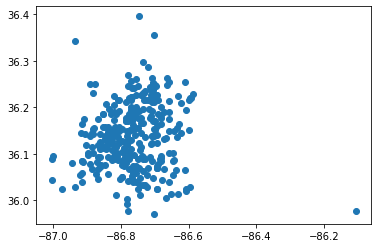

In [9]:
# Import pandas and matplotlib.pyplot using their customary aliases
import pandas as pd
import matplotlib.pyplot as plt
chickens_path='https://assets.datacamp.com/production/repositories/2409/datasets/fa767727ef9a7b39fb9f34bee3b1bc2f02682c81/Domesticated_Hen_Permits_clean_adjusted_lat_lng.csv'
# Load the dataset
chickens = pd.read_csv(chickens_path)

# Look at the first few rows of the chickens DataFrame
print(chickens.head())

# Plot the locations of all Nashville chicken permits
plt.scatter(x = chickens.lng , y = chickens.lat)

# Show the plot
plt.show()

## 1.3. Creating a GeoDataFrame & examining the geometry

Let's see where service districts are in Nashville. The path to the service district shapefile has been stored in the variable `shapefile_path`.

---
- Import `geopandas` with its common alias `gpd`.

- Read in the service district shapefile using `geopandas` and look at the first 5 rows using the `head()` method.

- Print the geometry field in the first row (rowname is '0') to see the data contained in that field. You will pass `service_district.loc[0, 'geometry']` to the `print()` function to do this.





```
shapefile_path

Out[2]:
'/home/repl/geo_export_ca87c034-2403-454e-8057-a3776934ed64.shp'
```



In [10]:
# # Import geopandas
# import geopandas as gpd 

# # Read in the services district shapefile and look at the first few rows.
# service_district = gpd.read_file(shapefile_path)
# print(service_district.head())

# # Print the contents of the service districts geometry in the first row
# print(service_district.loc[0, 'geometry'])

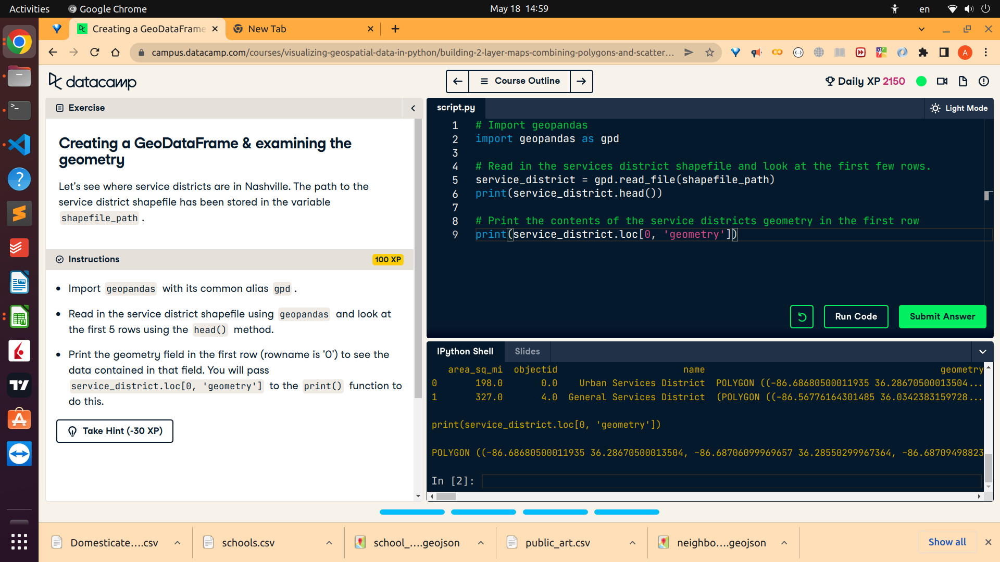

## 1.4. Plotting shapefile polygons

The next step is to show the map of polygons. We have imported `matplotlib.pyplot` as `plt` and `geopandas` as `gpd`, and a GeoDataFrame of the service districts called `service_district` has been pre-loaded for you.

---
- First plot the service districts without additional arguments by calling `.plot()` on the GeoDataFrame.

- Take a look at it with `plt.show()`. This has been done for you.

- Now use the `.plot()` method again, but this time add `column='name'` to color the shapes according to their names and `legend=True` to see those names. Remember to show the plot.

In [11]:
# # Import packages
# import geopandas as gpd
# import matplotlib.pyplot as plt

# # Plot the Service Districts without any additional arguments
# service_district.plot()
# plt.show()

# # Plot the Service Districts, color them according to name, and show a legend
# service_district.plot(column = 'name', legend = True)
# plt.show()

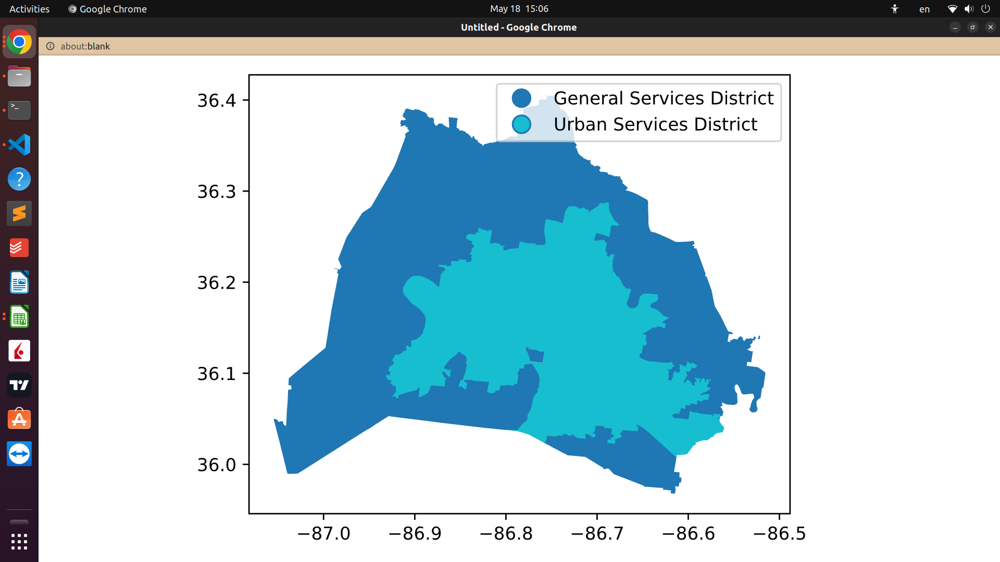

## 1.5. Geometry

Geometry is a special type of data structure. 

3 typical types geometries might be stored in a geometry field
- Points
- Lines
- Polygons

## 1.6. Plotting points over polygons - part 1

Make a basic plot of the service districts with the chicken locations. The packages needed have already been imported for you. The chickens `DataFrame` and `service_district` GeoDataFrame has been pre-loaded for you.

---

- Plot the shapefile for the service districts, using the `name` column to color the polygons.

- Add chicken locations, using the `lat` and `lng` columns from the chickens DataFrame, and make them black.

- Show your plot.

In [12]:
# # Plot the service district shapefile
# service_district.plot(column='name')

# # Add the chicken locations
# plt.scatter(x=chickens.lng, y=chickens.lat, c = 'black')

# # Show the plot
# plt.show()

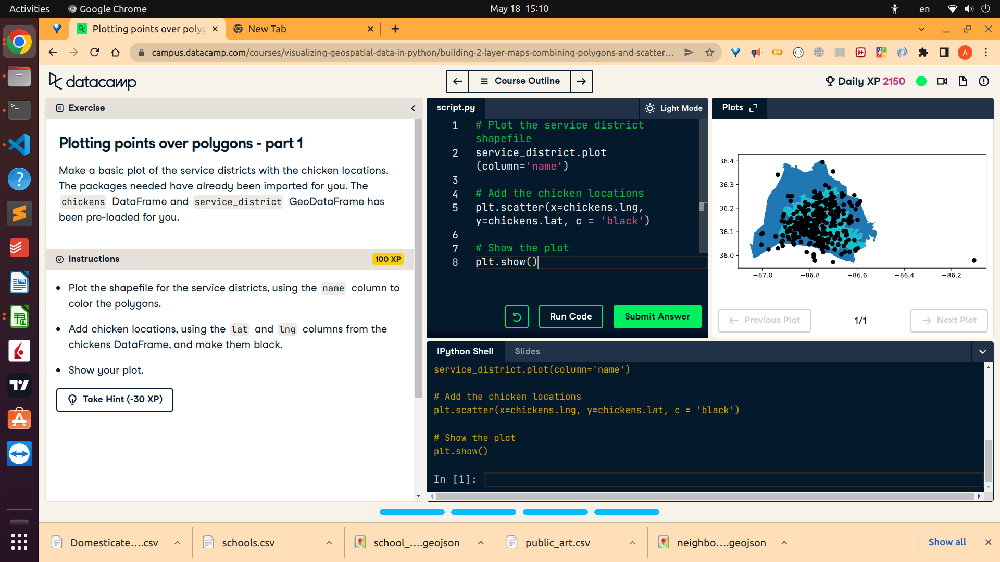

## 1.7. Plotting points over polygons - part 2

We have loaded the usual libraries as pd, plt, and gpd, the chickens dataset as `chickens`, and the service districts as `service_district`. Plot the service districts and chicken permits together to see what story your visualization tells.

---
- Start by plotting the GeoDataFrame with the service districts. Use the name column for your legend color.

- Next plot latitude and longitude from the chicken data to create a scatterplot. Specify 'black' for the marker color and give them a 'white' outline.

- Give the plot a title: 'Nashville Chicken Permits' and label the x-axis as 'longitude' and the y-axis as 'latitude'.

- Add grid lines and show your plot.

In [13]:
# # Plot the service district shapefile
# service_district.plot(column='name', legend=True)

# # Add the chicken locations
# plt.scatter(x=chickens.lng, y=chickens.lat, c='black', edgecolor = 'white')


# # Add labels and title
# plt.title('Nashville Chicken Permits')
# plt.xlabel('longitude')
# plt.ylabel('latitude')

# # Add grid lines and show the plot
# plt.grid()
# plt.show()

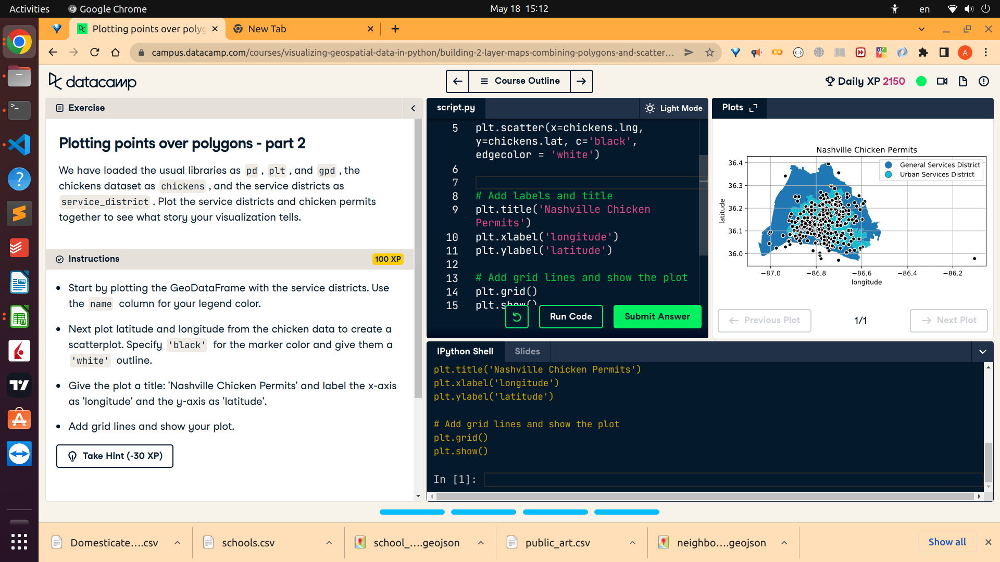

# Chapter 2: Creating and joining GeoDataFrames

You'll work with GeoJSON to create polygonal plots, learn about projections and coordinate reference systems, and get practice spatially joining data in this chapter. See [Slides for Chapter 2 here](https://drive.google.com/file/d/1aTz7xCb6ZA4tUL48rK2wWortftNRZfo-/view?usp=sharing).

## 2.1. Working with GeoJSON

The advantages of GeoJSON over shapefiles are:

- The file is human readable, so you can open it in a text editor and understand the contents.


- The file stands alone and doesn't rely on other files.


- GeoJSON supports multi-part geometries.

## 2.2. Colormaps

When you want to differentiate regions, but not imply any type of relationship between the regions, a qualitative colormap is the best choice. 

In this exercise you'll compare a qualitative colormap to a sequential (quantitative) colormap using the school districts GeoDataFrame, which is available for you as `school_districts`.

- Plot `school_districts` with the `tab20` colormap. Use 'district' to create a legend and set `legend_kwds = lgnd_kwds`.

In [16]:
school_districts=gpd.read_file("school_districts.geojson")

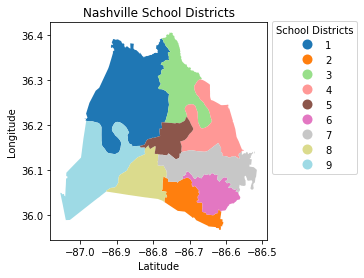

In [17]:
# Set legend style
lgnd_kwds = {'title': 'School Districts',
               'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

# Plot the school districts using the tab20 colormap (qualitative)
school_districts.plot(column = 'district', cmap = 'tab20', legend = True, legend_kwds = lgnd_kwds)
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Nashville School Districts')
plt.show();

- Plot school_districts with the sequential `summer` colormap. Keep the other arguments as they are.

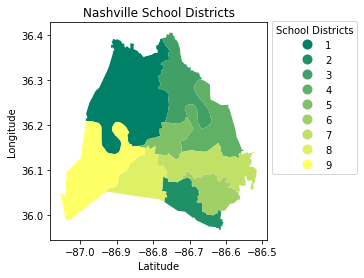

In [18]:
# Set legend style
lgnd_kwds = {'title': 'School Districts',
               'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

# Plot the school districts using the summer colormap (sequential)
school_districts.plot(column = 'district', cmap = 'summer', legend = True, legend_kwds = lgnd_kwds)
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Nashville School Districts')
plt.show();

- Plot the school districts without setting the column. Use the qualitative `Set3` colormap and set `legend = True`.

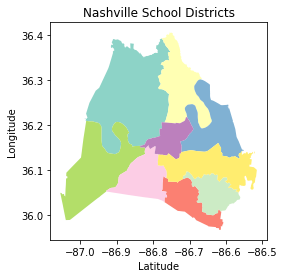

In [19]:
# Set legend style
lgnd_kwds = {'title': 'School Districts',
               'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

# Plot the school districts using Set3 colormap without the column argument
school_districts.plot(cmap = 'Set3', legend = True, legend_kwds = lgnd_kwds)
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Nashville School Districts')
plt.show();

## 2.3. Map Nashville neighborhoods

This time you'll read a GeoJSON file in to a GeoDataFrame to take a quick peek at where Nashville neighborhoods are.

---

- Import geopandas and matplotlib.pyplot using the customary aliases.

- Read in the neighborhoods GeoJSON file to a GeoDataFrame called neighborhoods and print the first few rows with `.head()`. The path to this file is stored in a variable called `neighborhoods_path`.

- Plot neighborhoods coloring the polygons by the name column of the GeoDataFrame and using the Dark2 color map. This time, don't include a legend.

- Show the plot.

                   name                                           geometry
0  Historic Buena Vista  MULTIPOLYGON (((-86.79511 36.17576, -86.79403 ...
1        Charlotte Park  MULTIPOLYGON (((-86.87460 36.15758, -86.87317 ...
2              Hillwood  MULTIPOLYGON (((-86.87614 36.13554, -86.87583 ...
3            West Meade  MULTIPOLYGON (((-86.90384 36.12554, -86.90328 ...
4          White Bridge  MULTIPOLYGON (((-86.86321 36.12886, -86.86321 ...


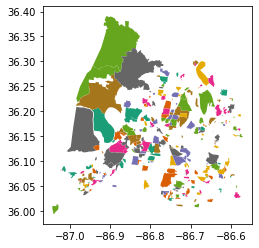

In [20]:
import geopandas as gpd
import matplotlib.pyplot as plt
neighborhoods_path="neighborhoods.geojson" #uploaded from local drive
# Read in the neighborhoods geojson file
neighborhoods = gpd.read_file(neighborhoods_path)

# Print the first few rows of neighborhoods
print(neighborhoods.head())

# Plot the neighborhoods, color according to name and use the Dark2 colormap
neighborhoods.plot(column = 'name', cmap = 'Dark2')

# Show the plot.
plt.show()

## 2.4. Changing coordinate reference systems
In this exercise you will learn how to find a GeoDataFrame's coordinate reference system and how to change it. The school districts GeoDataFrame is available as `school_districts`.

---

- Print the first row of `school_districts` and the `crs` property of this GeoDataFrame.
- Convert the coordinate reference system of `school_districts` to `epsg:3857`.
Print the crs property again to confirm that it was changed.

In [21]:
school_districts = gpd.read_file('school_districts.geojson')

In [22]:
# Print the first row of school districts GeoDataFrame and the crs
print(school_districts.head(1))
print(school_districts.crs)

   first_name       city    zip                           email state  \
0  Dr. Sharon  Nashville  37218  gentryfordistrict1@comcast.net    TN   

  last_name          address position term_expir district         phone  \
0    Gentry  6108 Beals Lane   Member       2016        1  615-268-5269   

                                            geometry  
0  MULTIPOLYGON (((-86.77136 36.38357, -86.77134 ...  
epsg:4326


In [23]:
# Convert the crs to epsg:3857
school_districts.geometry = school_districts.geometry.to_crs(epsg = 3857)
                        
# Print the first row of school districts GeoDataFrame and the crs again
print(school_districts.head(1))
print(school_districts.crs)

   first_name       city    zip                           email state  \
0  Dr. Sharon  Nashville  37218  gentryfordistrict1@comcast.net    TN   

  last_name          address position term_expir district         phone  \
0    Gentry  6108 Beals Lane   Member       2016        1  615-268-5269   

                                            geometry  
0  MULTIPOLYGON (((-9659344.056 4353528.767, -965...  
epsg:3857


## 2.5. Construct a GeoDataFrame from a DataFrame

In this exercise, you will construct a geopandas GeoDataFrame from the Nashville Public Art DataFrame. You will need to import the Point constructor from the shapely.geometry module to create a geometry column in art before you can create a GeoDataFrame from art. This will get you ready to spatially join the art data and the neighborhoods data in order to discover which neighborhood has the most art.

The Nashville Public Art data has been loaded for you as `art`.

In [24]:
import pandas as pd
art = pd.read_csv('public_art.csv')

In [25]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Print the first few rows of the art DataFrame
print(art.head(1))

                     Title Last Name First Name  \
0  [Cross Country Runners]     Frost      Miley   

                         Location  Medium       Type Description  Latitude  \
0  4001 Harding Rd., Nashville TN  Bronze  Sculpture         NaN  36.12856   

   Longitude       Mapped Location  
0   -86.8366  (36.12856, -86.8366)  


In [26]:
# Create a geometry column from lng & lat
art['geometry'] = art.apply(lambda x: Point(float(x.Longitude), float(x.Latitude)), axis=1)

# Create a GeoDataFrame from art and verify the type
art_geo = gpd.GeoDataFrame(art, crs = neighborhoods.crs, geometry = art.geometry)
print(type(art_geo))

<class 'geopandas.geodataframe.GeoDataFrame'>


/usr/local/lib/python3.7/dist-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [27]:
art_geo.head(2)

,Title,Last Name,First Name,Location,Medium,Type,Description,Latitude,Longitude,Mapped Location,geometry
0,[Cross Country Runners],Frost,Miley,"4001 Harding Rd., Nashville TN",Bronze,Sculpture,NaN,36.12856,-86.83660,"(36.12856, -86.8366)",POINT (-86.83660 36.12856)
1,[Fourth and Commerce Sculpture],Walker,Lin,"333 Commerce Street, Nashville TN",NaN,Sculpture,NaN,36.16234,-86.77774,"(36.16234, -86.77774)",POINT (-86.77774 36.16234)


## 2.6. Spatial join practice

Is there a difference between art (point data) that intersects with neighborhoods (polygon data) and art (point data) within neighborhoods (polygon data)? Explore different spatial joins with the `art_geo` and neighborhoods GeoDataFrames, which has been pre-loaded for you.

---
1. Write a spatial join to find the art in `art_geo` that intersects with `neighborhoods`. Call this `art_intersect_neighborhoods` and print the `.shape` property to see how many rows and columns resulted.

In [28]:
# Spatially join art_geo and neighborhoods 
# art_intersect_neighborhoods = gpd.sjoin(art_geo, neighborhoods, op = 'intersects')
art_intersect_neighborhoods = gpd.sjoin(art_geo, neighborhoods, predicate = 'intersects')
# Print the shape property of art_intersect_neighborhoods
print(art_intersect_neighborhoods.shape)

(40, 13)


2. Now write a spatial join to find the art in `art_geo` that is within `neighborhoods`. Call this `art_within_neighborhoods` and take a look at the `.shape` property to see how many rows and columns resulted.

In [29]:
# Create art_within_neighborhoods by spatially joining art_geo and neighborhoods
# art_within_neighborhoods = gpd.sjoin(art_geo, neighborhoods, op = 'within')
art_within_neighborhoods = gpd.sjoin(art_geo, neighborhoods, predicate = 'within')
# Print the shape property of art_within_neighborhoods
print(art_within_neighborhoods.shape)

(40, 13)


3. Finally, write a spatial join to find the art locations in `art_geo` that contain neighborhoods. Call this GeoDataFrame `art_containing_neighborhoods` and take a look at the `.shape` property to see how many rows and columns resulted.

In [30]:
# Spatially join art_geo and neighborhoods and using the contains op
# art_containing_neighborhoods = gpd.sjoin(art_geo, neighborhoods, op = 'contains')
art_containing_neighborhoods = gpd.sjoin(art_geo, neighborhoods, predicate = 'contains')
# Print the shape property of art_containing_neighborhoods
print(art_containing_neighborhoods.shape)

(0, 13)


## 2.7. Finding the neighborhood with the most public art

Now that you have created `art_geo`, a GeoDataFrame, from the art DataFrame, you can join it spatially to the neighborhoods data to see what art is in each neighborhood.

---
- Merge the `art_geo` and neighborhoods GeoDataFrames with a spatial join to create a new GeoDataFrame called `neighborhood_art`. Find the art that is `within` neighborhoods.

- Print the first few rows of the `neighborhood_art` GeoDataFrame.

In [31]:
# import packages
import geopandas as gpd
import pandas as pd

# Spatially join neighborhoods with art_geo
# neighborhood_art = gpd.sjoin(art_geo, neighborhoods, op = "within")
neighborhood_art = gpd.sjoin(art_geo, neighborhoods, predicate = "within")
# Print the first few rows
print(neighborhood_art.head(1))

                             Title Last Name First Name  \
1  [Fourth and Commerce Sculpture]    Walker        Lin   

                            Location Medium       Type Description  Latitude  \
1  333 Commerce Street, Nashville TN    NaN  Sculpture         NaN  36.16234   

   Longitude        Mapped Location                    geometry  index_right  \
1  -86.77774  (36.16234, -86.77774)  POINT (-86.77774 36.16234)           41   

              name  
1  Urban Residents  


## 2.8. Aggregating points within polygons
Now that you have spatially joined `art` and `neighborhoods`, you can group, aggregate, and sort the data to find which neighborhood has the most public art. You can count artwork titles to see how many artworks are in each neighborhood.

---
- Get just `name` and `Title` from `neighborhood_art` and then group by each neighborhood's name (`name`). Save this as `neighborhood_art_grouped`

- Aggregate `neighborhood_art_grouped` to see how many artworks are within each polygon. Use the `.agg('count')` function to get a count of art in each neighborhood and sort the results with `.sort_values()`, sorting `by Title` with `ascending` set to `False`. Print it.

In [32]:
# Get name and title from neighborhood_art and group by name
neighborhood_art_grouped = neighborhood_art[['name', 'Title']].groupby('name')

# Aggregate the grouped data and count the artworks within each polygon
print(neighborhood_art_grouped.agg('count').sort_values(by = 'Title', ascending = False))

                          Title
name                           
Urban Residents              22
Lockeland Springs             3
Edgehill (ONE)                2
Germantown                    2
Hillsboro-West End            2
Inglewood                     2
Sunnyside                     2
Chestnut Hill (TAG)           1
Historic Edgefield            1
McFerrin Park                 1
Renraw                        1
Wedgewood Houston (SNAP)      1


## 2.9. Plotting the Urban Residents neighborhood and art

Now you know that most art is in the Urban Residents neighborhood. In this exercise, you'll create a plot of art in that neighborhood. First you will subset just the `urban_art` from `neighborhood_art` and you'll subset the `urban_polygon` from `neighborhoods`. Then you will create a plot of the polygon as `ax` before adding a plot of the art.

---

- Create a GeoDataFrame called `urban_art` using the `.loc[]` accessor to get only the art in the `"Urban Residents"` neighborhood.

- Use `.loc[]` again to create a GeoDataFrame called `urban_polygon` from neighborhoods with only the `"Urban Residents"` polygon.

- Plot `urban_polygon` as `ax` and set `color` to `lightgreen`.

- Plot the art in `urban_art`. Pass three arguments: 
  - Set `ax = ax` to add this plot to the `urban_polygon`, 
  - use `Type` to label the points, 
  - and set `legend = True`.

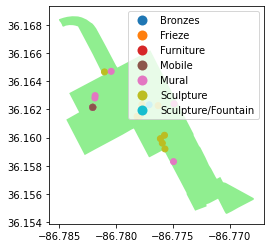

In [33]:
# Create urban_art from neighborhood_art where the neighborhood name is Urban Residents
urban_art = neighborhood_art.loc[neighborhood_art.name == "Urban Residents"]

# Get just the Urban Residents neighborhood polygon and save it as urban_polygon
urban_polygon = neighborhoods.loc[neighborhoods.name == "Urban Residents"]

# Plot the urban_polygon as ax 
ax = urban_polygon.plot(color = 'lightgreen')

# Add a plot of the urban_art and show it
urban_art.plot( ax = ax, column = 'Type', legend = True);
plt.show()

# Chapter 3: GeoSeries and folium

First you will learn to get information about the geometries in your data with three different GeoSeries attributes and methods. Then you will learn to create a street map layer using folium. See [Slides for Chapter 3 here](https://drive.google.com/file/d/1LFISDsubwykgMwLw-DXrqdHIK-OxyngK/view?usp=sharing).

## 3.1. GeoSeries attributes and methods I

Find the area of the Urban Residents neighborhood.

How big is the Urban Residents neighborhood?

---

- Print the urban polygon and notice the units of each longitude/latitude pair.

- Create `urban_poly_3857` by calling `to_crs()` on `urban_polygon` and print the head again. Notice the units of each longitude/latitude pair have changed.

- Print the area of the `urban_poly_3857` geometry. Remember to divide by `10**6` to get kilometers squared.

In [34]:
import numpy as np

In [35]:
# Print the head of the urban polygon 
print(urban_polygon.head())

# Create a copy of the urban_polygon using EPSG:3857 and print the head
urban_poly_3857 = urban_polygon.to_crs(epsg = 3857)
print(urban_poly_3857.head())

# Print the area of urban_poly_3857 in kilometers squared
# area = urban_poly_3857.geometry.area/ 10**6
area = urban_poly_3857.geometry.area.squeeze() / 10**6
# 

               name                                           geometry
41  Urban Residents  MULTIPOLYGON (((-86.78122 36.16457, -86.78205 ...
               name                                           geometry
41  Urban Residents  MULTIPOLYGON (((-9660441.281 4323289.005, -966...


In [36]:
print('The area of the Urban Residents neighborhood is ', area, ' km squared')

The area of the Urban Residents neighborhood is  1.128989605798646  km squared


## 3.2. GeoSeries attributes and methods II

The center of the Urban Residents neighborhood.

Now you'll find the center point of the urban_poly_3857 and plot it over the polygon.

---
- Create `downtown_center`, from `urban_poly_3857` using the GeoSeries `centroid` attribute.
- Print the datatype of `downtown_center`.
- Plot `urban_poly_3857` as `ax` using `lightgreen` for the color.
- Plot the `downtown_center`, setting `ax = ax` and `color = black`. The x-axis ticks are rotated for you. We've included the code to show the plot.

<class 'geopandas.geoseries.GeoSeries'>


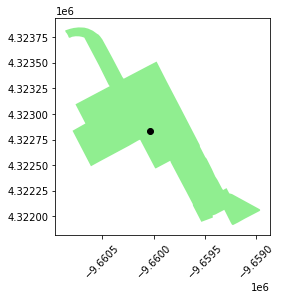

In [37]:
# Create downtown_center from urban_poly_3857
downtown_center = urban_poly_3857.geometry.centroid

# Print the type of downtown_center 
print(type(downtown_center))

# Plot the urban_poly_3857 as ax and add the center point
ax = urban_poly_3857.plot(color = 'lightgreen')
downtown_center.plot(ax = ax, color = 'black')
plt.xticks(rotation = 45)

# Show the plot
plt.show()

## 3.3. Preparing GeoDataFrame to calculate distances

In this exercise you will prepare a GeoDataFrame called `art_dist_meters` with the locations of downtown art converted to meters using EPSG:3857. You will use `art_dist_meters` in the next exercise to calculate the distance of each artwork from the center of the Urban Residents neighborhood in meters.

The `art` data has been pre-loaded for you, along with `urban_poly_3857` and `center_point`, the center point of the Urban Residents neighborhood. A geometry column called `geometry` that uses degrees has already been created in the `art` DataFrame.

---

- Create a GeoDataFrame called `art_dist_meters`, using the `art` DataFrame and the `geometry` column from `art`. Set `crs = {'init': 'epsg:4326'}` since the `geometry` is in decimal degrees. Print the first two rows.

- Now explicitly set the coordinate reference system to EPSG:3857 for `art_dist_meters` by using `to_crs()`. Print the first two rows again.
- Add a column called `center` to `art_dist_meters`, setting it equal to `center_point` for every row .

In [38]:
# Import packages
from shapely.geometry import Point
import geopandas as gpd
import pandas as pd

# Create art_dist_meters using art and the geometry from art
# art_dist_meters = gpd.GeoDataFrame(art, geometry = art.geometry, crs = {'init': 'epsg:4326'})
art_dist_meters = gpd.GeoDataFrame(art, geometry = art.geometry, crs = ('EPSG:4326'))

print(art_dist_meters.head(1))

                     Title Last Name First Name  \
0  [Cross Country Runners]     Frost      Miley   

                         Location  Medium       Type Description  Latitude  \
0  4001 Harding Rd., Nashville TN  Bronze  Sculpture         NaN  36.12856   

   Longitude       Mapped Location                    geometry  
0   -86.8366  (36.12856, -86.8366)  POINT (-86.83660 36.12856)  


In [39]:
# Set the crs of art_dist_meters to use EPSG:3857
art_dist_meters.geometry = art_dist_meters.geometry.to_crs(epsg = 3857)
print(art_dist_meters.head(1))

                     Title Last Name First Name  \
0  [Cross Country Runners]     Frost      Miley   

                         Location  Medium       Type Description  Latitude  \
0  4001 Harding Rd., Nashville TN  Bronze  Sculpture         NaN  36.12856   

   Longitude       Mapped Location                          geometry  
0   -86.8366  (36.12856, -86.8366)  POINT (-9666606.094 4318325.479)  


In [40]:
# Defining center_point
center_point=Point(-9660034.312198792, 4322835.782813124)
# Add a column to art_meters, center
art_dist_meters['center'] = center_point
art_dist_meters.head(1)

,Title,Last Name,First Name,Location,Medium,Type,Description,Latitude,Longitude,Mapped Location,geometry,center
0,[Cross Country Runners],Frost,Miley,"4001 Harding Rd., Nashville TN",Bronze,Sculpture,NaN,36.12856,-86.8366,"(36.12856, -86.8366)",POINT (-9666606.094 4318325.479),POINT (-9660034.312198792 4322835.782813124)


## 3.4. Art distances from neighborhood center

Now that you have the center point and the art locations in the units we need to calculate distances in meters, it's time to perform that step.

---
- Import the package to help with pretty printing.

- Create a dictionary, `art_distances` by iterating through `art_dist_meters`, using `title` as the key and the `distance()` from `center` as the value. Pass `center` as the other argument to `GeoSeries.distance()`.

- Pretty print `art_distances` using the `pprint` method of `pprint`.

In [41]:
# Import package for pretty printing
import pprint

# Build a dictionary of titles and distances for Urban Residents art
art_distances = {}
for row in art_dist_meters.iterrows():
    vals = row[1]
    # print(vals)
    key = vals['Title']
    ctr = vals['center']
    art_distances[key] = vals['geometry'].distance(ctr)

# Pretty print the art_distances
pprint.pprint(art_distances)

{'12th & Porter Mural': 1269.1502879123295,
 'A Splash of Color': 2471.77473845602,
 'A Story of Nashville': 513.563203047246,
 'Aerial Innovations Mural': 4516.755210409118,
 'Airport Sun Project': 12797.594229783339,
 'Andrew Jackson': 948.9812821647014,
 'Angel': 10202.565989738408,
 'Anticipation': 688.8349105293755,
 'April Baby': 4779.3944249488095,
 'Arial Triangle [from the Gravity Series]': 4315.322141148497,
 'Ariel': 4380.927773955953,
 'Athena Parthenos': 4294.778095689335,
 'Benedictio': 5313.624214293596,
 'Bicycle Bus-Green Fleet': 468.08286355622516,
 'Blowing Bubbles': 10202.565989738408,
 'Breaking Bread': 1279.2562933101267,
 'Building a Positive Community': 2253.417997416559,
 'Can-Do': 5648.086322081346,
 'Chet Atkins': 604.4489448108361,
 "Children's Chairs For The Seasons": 513.563203047246,
 'Confederate Memorial': 5313.624214293596,
 'Confederate Private Monument': 4316.459103419423,
 'Confluence': 2918.5244121008895,
 'Cool Fences': 6491.846030119041,
 'Dancin

## 3.5. Street maps with folium / Create a folium location from the urban centroid

In order to construct a folium map of the Urban Residents neighborhood, you need to build a coordinate pair location that is formatted for folium.

---
- Print the head of `urban_polygon`.

- Store the first occurrence of `center` as `urban_center` and print `urban_center`. This has been done for you.

- Create an array from urban_center that reverses the order of longitude and latitude. Call this `urban_location`.

- Print `urban_location`. This has been done for you.

In [42]:
urban_polygon['center']=Point(-86.77756457127047,36.16127820928791)

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [43]:
# Print the head of the urban_polygon
print(urban_polygon.head())

               name                                           geometry  \
41  Urban Residents  MULTIPOLYGON (((-86.78122 36.16457, -86.78205 ...   

                                          center  
41  POINT (-86.77756457127047 36.16127820928791)  


In [44]:
# Print the head of the urban_polygon
print(urban_polygon.head())

# Create urban_center from the urban_polygon center
urban_center = urban_polygon.center.squeeze()
# Use squeeze to get rid of index which causes error

# Print urban_center
print(urban_center)

               name                                           geometry  \
41  Urban Residents  MULTIPOLYGON (((-86.78122 36.16457, -86.78205 ...   

                                          center  
41  POINT (-86.77756457127047 36.16127820928791)  
POINT (-86.77756457127047 36.16127820928791)


In [45]:
# Create array for folium called urban_location
urban_location = [urban_center.y, urban_center.x]

# Print urban_location
print(urban_location)

[36.16127820928791, -86.77756457127047]


## 3.6. Create a folium map of downtown Nashville
In this exercise you will create a street map of downtown Nashville using folium.

---
- Construct a folium map called `downtown_map`. Use the `urban_location` array you created in the previous exercise and set the `zoom_start` level to 15.

- Display your folium map object with the provided `display` function.

In [46]:
import folium

In [47]:
# Construct a folium map with urban_location
downtown_map = folium.Map(location = urban_location, zoom_start = 15)

# Display the map
display(downtown_map)

## 3.7. Folium street map of the downtown neighborhood

This time you will create the folium map of downtown and add the Urban Residents neighborhood area from `urban_polygon`. The `urban_polygon` has been printed to your console.

--- 

- Create an array called `folium_loc` from urban_polygon.center
- Create a folium map called `downtown_map`. Set the location argument equal to `folium_loc` and initialize the map with a `zoom_start` of 15.

- Pass the geometry from the `urban_polygon` GeoDataFrame to the `folium.GeoJson()` method. Then call `add_to()` on that.

In [48]:
point = urban_polygon.center
point

41    POINT (-86.77756457127047 36.16127820928791)
Name: center, dtype: object

In [49]:
# Create array for called folium_loc from the urban_polygon center point
point = urban_polygon.center.squeeze() # Use Squeeze to get rid of index which causes error
folium_loc = [point.y, point.x]

# Construct a map from folium_loc: downtown_map
downtown_map = folium.Map(location = folium_loc, zoom_start = 15)

# Draw our neighborhood: Urban Residents
folium.GeoJson(urban_polygon.geometry).add_to(downtown_map)

# Display the map
display(downtown_map)

## 3.8. Creating markers in folium / Adding markers for the public art

Now that you have added the polygon for the Urban Residents neighborhood to your folium street map, it's time to add the locations of the art within the neighborhood. You can do that by creating folium markers. Each marker needs a location assigned. Use `iterrows()` to loop through the data to grab the values you need.

---

- First take a look at the tuple returned by `iterrows()` by printing the first and second values.
- Assign the second value of the `iterrows()` tuple to `row_values`. Create a location formatted for `folium`, use it to build a marker, and add it to the `downtown_map`.
- Display the map.

In [50]:
urban_art.head(1)

,Title,Last Name,First Name,Location,Medium,Type,Description,Latitude,Longitude,Mapped Location,geometry,index_right,name
1,[Fourth and Commerce Sculpture],Walker,Lin,"333 Commerce Street, Nashville TN",NaN,Sculpture,NaN,36.16234,-86.77774,"(36.16234, -86.77774)",POINT (-86.77774 36.16234),41,Urban Residents


In [51]:
# Iterate through the urban_art and print each part of tuple returned
for row in urban_art.iterrows():
  print('first part: ', row[0])
  print('second part: ', row[1])

# Create a location and marker with each iteration for the downtown_map
for row in urban_art.iterrows():
    row_values = row[1] 
    # location = [row_values['lat'], row_values['lng']]
    location = [row_values['Latitude'], row_values['Longitude']]
    marker = folium.Marker(location = location)
    marker.add_to(downtown_map)

# Display the map
display(downtown_map)

first part:  1
second part:  Title                [Fourth and Commerce Sculpture]
Last Name                                     Walker
First Name                                       Lin
Location           333 Commerce Street, Nashville TN
Medium                                           NaN
Type                                       Sculpture
Description                                      NaN
Latitude                                    36.16234
Longitude                                  -86.77774
Mapped Location                (36.16234, -86.77774)
geometry                  POINT (-86.77774 36.16234)
index_right                                       41
name                                 Urban Residents
Name: 1, dtype: object
first part:  4
second part:  Title                                           A Story of Nashville
Last Name                                                     Ridley
First Name                                                      Greg
Location               

## 3.9. Preprocessing data issues for folium Popups

You will be building popups for the downtown art using the `title` and `desc` columns from the `urban_art` DataFrame. Here, you will inspect those columns to identify and clean up any problematic values.

---

- Print and inspect the values in the `title` column of the `urban_art` DataFrame.

- Print and inspect the values in the `desc` column of the `urban_art` DataFrame.

- Use the `fillna()` method to replace the `NaN` values in the desc column with empty strings, and use `.str.replace` to replace the apostrophes `(')` with back-ticks `(`)`.

- Print the descriptions again to verify your work.





In [52]:
urban_art.head(1)

,Title,Last Name,First Name,Location,Medium,Type,Description,Latitude,Longitude,Mapped Location,geometry,index_right,name
1,[Fourth and Commerce Sculpture],Walker,Lin,"333 Commerce Street, Nashville TN",NaN,Sculpture,NaN,36.16234,-86.77774,"(36.16234, -86.77774)",POINT (-86.77774 36.16234),41,Urban Residents


In [53]:
# Print the urban_art titles
print(urban_art.Title)

#Print the urban_art descriptions
print(urban_art.Description)

# Replace Nan and ' values in description
urban_art.Description.fillna('', inplace = True)
urban_art.Description = urban_art.Description.str.replace("'", "`")

#Print the urban_art descriptions again
print(urban_art.Description)

1                        [Fourth and Commerce Sculpture]
4                                   A Story of Nashville
21                                           Chet Atkins
22                     Children's Chairs For The Seasons
34                                       Foliated Scroll
39                                          Gone Fishing
40                             Happy Times at The Arcade
54                                     Johnny Cash Mural
55                                 La Storia della Terra
57                                 Les Paul Guitar Mural
59                                         Library Doors
60                               Lightning Wire Fountain
66     Nashville, A History through Maps and Aerial V...
67                                               Oh, Roy
68                                  Orpheus and Eurydice
75                               Piecing It All Together
104                                  The Birth of Apollo
105                            

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


## 3.10. Folium Popups for a map of downtown art

Now you will assign a popup to each marker to give information about the artwork at each location. In particular you will assign the art title and description to the popup for each marker. You will do so by creating the map object `downtown_map`, then add the popups, and finally use the `display` function to show your map.

One warning before you start: you'll need to ensure that all instances of single quotes `(')` are removed from the pop-up message, otherwise your plot will not render!

---
- For each row in `urban_art`, build a popup message that includes the title and description for the corresponding artwork.
- Complete the code to replace all instances of single quotes (') with backticks (`) in the popup messages.
- Display the finished map.


In [54]:
nashville=[36.16127820928791, -86.77756457127047]

In [55]:
urban_polygon.drop('center', inplace=True, axis=1)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [56]:
urban_polygon = urban_polygon.reset_index(drop=True)

In [57]:
urban_polygon

,name,geometry
0,Urban Residents,"MULTIPOLYGON (((-86.78122 36.16457, -86.78205 ..."


In [58]:
urban_art.head(1)

,Title,Last Name,First Name,Location,Medium,Type,Description,Latitude,Longitude,Mapped Location,geometry,index_right,name
1,[Fourth and Commerce Sculpture],Walker,Lin,"333 Commerce Street, Nashville TN",NaN,Sculpture,,36.16234,-86.77774,"(36.16234, -86.77774)",POINT (-86.77774 36.16234),41,Urban Residents


In [59]:
from IPython.display import HTML, display

In [60]:
urban_art.head(1)

,Title,Last Name,First Name,Location,Medium,Type,Description,Latitude,Longitude,Mapped Location,geometry,index_right,name
1,[Fourth and Commerce Sculpture],Walker,Lin,"333 Commerce Street, Nashville TN",NaN,Sculpture,,36.16234,-86.77774,"(36.16234, -86.77774)",POINT (-86.77774 36.16234),41,Urban Residents


In [ ]:
# Construct downtown map
downtown_map = folium.Map(location = nashville, zoom_start = 15)
folium.GeoJson(urban_polygon.geometry).add_to(downtown_map)
# folium.GeoJson(urban_polygon).add_to(downtown_map)

# Create popups inside the loop you built to create the markers
for row in urban_art.iterrows():
    row_values = row[1]
    # print(row_values) 
    location = [row_values['Latitude'], row_values['Longitude']]
    popup = (str(row_values['Title']) + ': ' + 
             str(row_values['Description'])).replace("'", "`")
    marker = folium.Marker(location = location, popup = popup)
    marker.add_to(downtown_map)

# Display the map.
display(downtown_map)

https://stackoverflow.com/questions/36969991/folium-map-not-displaying

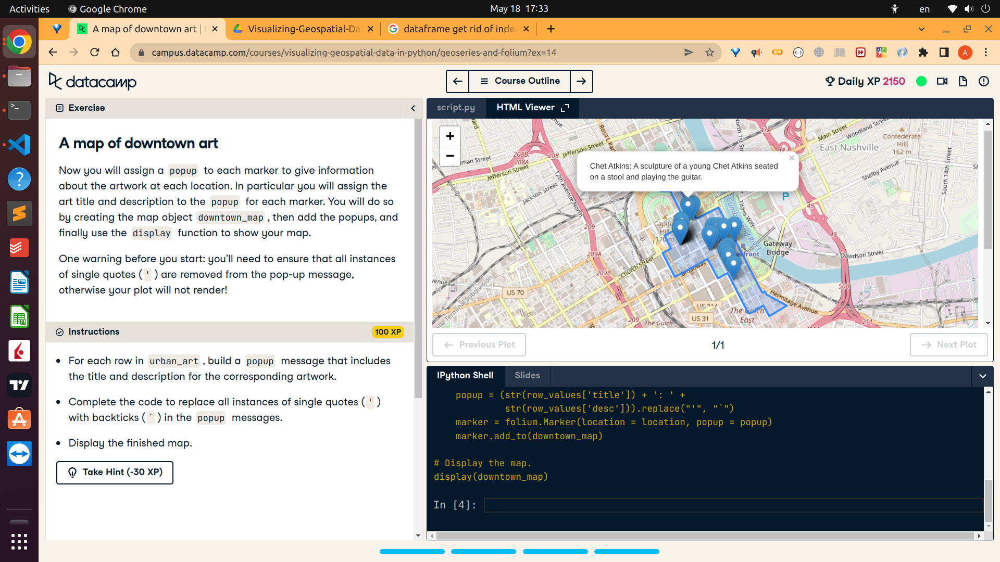

# Chapter 4: Creating a choropleth building permit density in Nashville

In this chapter, you will learn about a special map called a choropleth. Then you will learn and practice building choropleths using two different packages: geopandas and folium. See [Slides for Chapter 4 here](https://drive.google.com/file/d/12ZtaEUVQlVeD5A3nxlJH9R0HuCW-Sh7n/view?usp=sharing).

## 4.1. Finding counts from a spatial join
You will be using a dataset of the building permits issued in Nashville during 2017. This DataFrame, called `permits`, has been pre-loaded for you, along with the `council_districts` GeoDataFrame.

---
- Create a Point `geometry` column in permits from `lat` and `lng`.

- Create `permits_geo`, a GeoDataFrame, using `permits`, the crs from `council_districts`, and the `geometry` from `permits`.

- Use a spatial join to find permits issued `within` each council district. Print the first 2 rows.

- Create `permit_counts` to show the count of permits within each district, using `groupby()` and `.size()`. Print `permit_counts`.

In [63]:
permits=pd.read_csv("building_permits_2017.csv")

In [64]:
council_districts=gpd.read_file("council_districts.geojson")

In [66]:
from shapely.geometry import Point

# Create a shapely Point from lat and lng
permits['geometry'] = permits.apply(lambda x: Point((x.lng , x.lat)), axis = 1)

# Build a GeoDataFrame: permits_geo
permits_geo = gpd.GeoDataFrame(permits, crs = council_districts.crs, geometry = permits.geometry)

# Spatial join of permits_geo and council_districts
permits_by_district = gpd.sjoin(permits_geo, council_districts, op = 'within')
print(permits_by_district.head(2))



/usr/local/lib/python3.7/dist-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2822: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if self.run_code(code, result):


     permit_id      issued      cost        lat        lng  \
0   2017032777  2017-05-24  226201.0  36.198241 -86.742235   
68  2017053890  2017-09-05       0.0  36.185442 -86.768239   

                      geometry  index_right first_name  \
0   POINT (-86.74223 36.19824)            5      Scott   
68  POINT (-86.76824 36.18544)            5      Scott   

                        email     res_phone     bus_phone last_name  \
0   scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   
68  scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   

          position district  
0   Council Member        5  
68  Council Member        5  


In [67]:
# Create permit_counts
permit_counts = permits_by_district.groupby(['district']).size()
print(permit_counts)

district
1     146
10    119
11    239
12    163
13    139
14    261
15    322
16    303
17    786
18    287
19    969
2     399
20    799
21    569
22    291
23    206
24    458
25    435
26    179
27    105
28    119
29    154
3     215
30     79
31    134
32    225
33    355
34    218
35    192
4     139
5     452
6     455
7     468
8     209
9     186
dtype: int64


## 4.2. Council district areas and permit counts

In order to create a normalized value for the building permits issued in each council district, you will need to find the area of each council district. Remember that you can leverage the area attribute of a GeoSeries to do this. You will need to convert `permit_counts` to a DataFrame so you can merge it with the `council_districts` data. Both `permit_counts` and `council_districts` are available for you.

---
1. Get the area of each council district and store it in a new column, `area`, in the `council_districts` GeoDataFrame. Print the first two rows.

In [68]:
# Create an area column in council_districts
council_districts['area'] = council_districts.geometry.area
print(council_districts.head(2))

  first_name                           email     res_phone     bus_phone  \
0       Nick     nick.leonardo@nashville.gov  615-509-6334  615-862-6780   
1    DeCosta  decosta.hastings@nashville.gov  615-779-1565  615-862-6780   

  last_name        position district  \
0  Leonardo  Council Member        1   
1  Hastings  Council Member        2   

                                            geometry      area  
0  MULTIPOLYGON (((-86.90738 36.39052, -86.90725 ...  0.022786  
1  MULTIPOLYGON (((-86.75902 36.23091, -86.75909 ...  0.002927  


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  


2. Next convert `permit_counts` to a DataFrame with the .`to_frame()` method, and print the first two rows.

In [69]:
# Convert permit_counts to a DataFrame
permits_df = permit_counts.to_frame()
print(permits_df.head(2))

            0
district     
1         146
10        119


3. Reset the index using the `inplace = True` argument and set the `columns` attribute to a list with the names `district` and `bldg_permits`. Print the first two rows again to see what `permits_df` looks like now.

In [70]:
# Reset index and column names
permits_df.reset_index(inplace=True)
permits_df.columns = ['district', 'bldg_permits']
print(permits_df.head(2))

  district  bldg_permits
0        1           146
1       10           119


4. Create a new GeoDataFrame called `districts_and_permits` by merging `council_districts` and `permits_df` on the `district` column. Take a look at the first two rows.

In [71]:
# Merge council_districts and permits_df: 
districts_and_permits = pd.merge(council_districts, permits_df, on = 'district')
print(districts_and_permits.head(2))

  first_name                           email     res_phone     bus_phone  \
0       Nick     nick.leonardo@nashville.gov  615-509-6334  615-862-6780   
1    DeCosta  decosta.hastings@nashville.gov  615-779-1565  615-862-6780   

  last_name        position district  \
0  Leonardo  Council Member        1   
1  Hastings  Council Member        2   

                                            geometry      area  bldg_permits  
0  MULTIPOLYGON (((-86.90738 36.39052, -86.90725 ...  0.022786           146  
1  MULTIPOLYGON (((-86.75902 36.23091, -86.75909 ...  0.002927           399  


## 4.3. Calculating a normalized metric
Now you are ready to divide the number of building permits issued for projects in each council district by the area of that district to get a normalized value for the permits issued. First you will verify that the `districts_and_permits` is still a GeoDataFrame.

---

- Print the `type()` of `districts_and_permits`.

- Add one more column to `districts_and_permits`. Use a lambda expression and the pandas `apply()` method to divide the number of building permits issued for projects in each council district by the area of that district to get a normalized value for the permits issued.

- Print the first five rows of `districts_and_permits`.

In [72]:
# Print the type of districts_and_permits
print(type(districts_and_permits))

# Create permit_density column in districts_and_permits
districts_and_permits['permit_density'] = districts_and_permits.apply(lambda row: row.bldg_permits / row.area, axis = 1)

# Print the head of districts_and_permits
print(districts_and_permits.head())

<class 'geopandas.geodataframe.GeoDataFrame'>
  first_name                           email     res_phone     bus_phone  \
0       Nick     nick.leonardo@nashville.gov  615-509-6334  615-862-6780   
1    DeCosta  decosta.hastings@nashville.gov  615-779-1565  615-862-6780   
2      Nancy    nancy.vanreece@nashville.gov  615-576-0488  615-862-6780   
3       Bill    bill.pridemore@nashville.gov  615-915-1419  615-862-6780   
4     Robert      robert.swope@nashville.gov  615-308-0577  615-862-6780   

   last_name        position district  \
0   Leonardo  Council Member        1   
1   Hastings  Council Member        2   
2   VanReece  Council Member        8   
3  Pridemore  Council Member        9   
4      Swope  Council Member        4   

                                            geometry      area  bldg_permits  \
0  MULTIPOLYGON (((-86.90738 36.39052, -86.90725 ...  0.022786           146   
1  MULTIPOLYGON (((-86.75902 36.23091, -86.75909 ...  0.002927           399   
2  MULTIPO

## 4.4. Choropleths with geopandas 

First you will plot a choropleth of the building permit density for each council district using the default colormap. Then you will polish it by changing the colormap and adding labels and a title.

---
1. Import `matplotlib.pyplot`, `pandas`, and `geopandas` with the customary aliases.

2. Plot `districts_and_permits`, using the `permit_density ` column you just created and the default colormap. Be sure to call `plt.show()`.

3. Create a more polished choropleth of `permit_density`. Use the `BuGn` colormap, outline the polygons in black, create axis labels (`longitude` and `latitude`), and a title('2017 Building Project Density by Council District'). Show the plot.

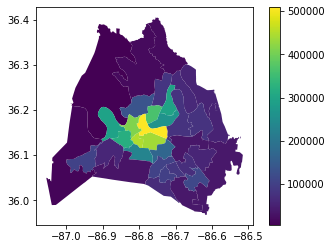

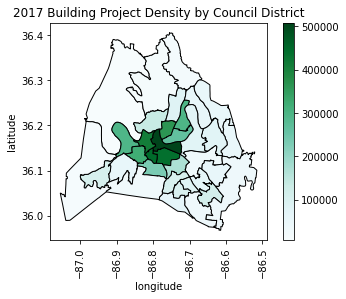

In [73]:
# 1. Import packages
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd

# 2. Simple plot of building permit_density
districts_and_permits.plot(column = 'permit_density', legend = True);
plt.show();

3. # Polished choropleth of building permit_density
districts_and_permits.plot(column = 'permit_density', cmap = 'BuGn', edgecolor = 'black', legend = True)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.xticks(rotation = 'vertical')
plt.title('2017 Building Project Density by Council District')
plt.show();

## 4.5. Choropleth - Area in km squared, geometry in decimal degrees
In this exercise, you'll start again with the `council_districts` GeoDataFrame and the permits `DataFrame`. You will change the `council_districts` to use the EPSG 3857 coordinate reference system before creating a column for `area`. 

Once the `area` column has been created, you will change the CRS back to EPSG 4326 so that the geometry is in decimal degrees.

---

- Change the coordinate reference system for the `council_districts` to EPSG 3857, and print the `crs` and first two rows again.

- Create a column called `area`. Divide the area of each polygon by `sqm_to_sqkm` to get the area in kilometers squared.

- Change the coordinate reference system for the `council_districts` back to EPSG 4326. Print the `crs` and first two rows.

In [75]:
# Change council_districts crs to epsg 3857
council_districts = council_districts.to_crs(epsg = 3857)
print(council_districts.crs)
print(council_districts.head())

epsg:3857
  first_name                           email     res_phone     bus_phone  \
0       Nick     nick.leonardo@nashville.gov  615-509-6334  615-862-6780   
1    DeCosta  decosta.hastings@nashville.gov  615-779-1565  615-862-6780   
2      Nancy    nancy.vanreece@nashville.gov  615-576-0488  615-862-6780   
3       Bill    bill.pridemore@nashville.gov  615-915-1419  615-862-6780   
4     Robert      robert.swope@nashville.gov  615-308-0577  615-862-6780   

   last_name        position district  \
0   Leonardo  Council Member        1   
1   Hastings  Council Member        2   
2   VanReece  Council Member        8   
3  Pridemore  Council Member        9   
4      Swope  Council Member        4   

                                            geometry        area  
0  MULTIPOLYGON (((-9674485.565 4354489.556, -967...  350.194851  
1  MULTIPOLYGON (((-9657970.373 4332440.650, -965...   44.956987  
2  MULTIPOLYGON (((-9654572.680 4339671.152, -965...   38.667932  
3  MULTIPOLYGON ((

In [76]:
# Create area in square km
sqm_to_sqkm = 10**6
council_districts['area'] = council_districts.geometry.area / sqm_to_sqkm

# Change council_districts crs back to epsg 4326
council_districts = council_districts.to_crs(epsg = 4326)
print(council_districts.crs)
print(council_districts.head())

epsg:4326
  first_name                           email     res_phone     bus_phone  \
0       Nick     nick.leonardo@nashville.gov  615-509-6334  615-862-6780   
1    DeCosta  decosta.hastings@nashville.gov  615-779-1565  615-862-6780   
2      Nancy    nancy.vanreece@nashville.gov  615-576-0488  615-862-6780   
3       Bill    bill.pridemore@nashville.gov  615-915-1419  615-862-6780   
4     Robert      robert.swope@nashville.gov  615-308-0577  615-862-6780   

   last_name        position district  \
0   Leonardo  Council Member        1   
1   Hastings  Council Member        2   
2   VanReece  Council Member        8   
3  Pridemore  Council Member        9   
4      Swope  Council Member        4   

                                            geometry        area  
0  MULTIPOLYGON (((-86.90738 36.39052, -86.90725 ...  350.194851  
1  MULTIPOLYGON (((-86.75902 36.23091, -86.75909 ...   44.956987  
2  MULTIPOLYGON (((-86.72850 36.28328, -86.72791 ...   38.667932  
3  MULTIPOLYGON ((

## 4.6. Spatially joining and getting counts

You will continue preparing your dataset for plotting a `geopandas` choropleth by creating a GeoDataFrame of the `building_permits` spatially joined to the `council_districts`. 


After that, you will be able to get counts of the `building_permits` issued in each council district.

---

- Create `permits_geo` from permits, the `council_districts.crs`, and the `geometry in permits`.

- Spatially join `permits_geo` and the `council_districts` to get building permits `within` each council district. Call this `permits_by_district`.

- Count permits in each district, `permit_counts`, by chaining `groupby()` and `size()` methods.

- Create `counts_df` from `permit_counts`. Reset the index, and name the columns `district` and `bldg_permits`.

In [79]:
# Create permits_geo
permits_geo = gpd.GeoDataFrame(permits, crs = council_districts.crs, geometry = permits.geometry)

# Spatially join permits_geo and council_districts
# permits_by_district = gpd.sjoin(permits_geo, council_districts, op = 'within')
permits_by_district = gpd.sjoin(permits_geo, council_districts, predicate = 'within')
print(permits_by_district.head(2))

     permit_id      issued      cost        lat        lng  \
0   2017032777  2017-05-24  226201.0  36.198241 -86.742235   
68  2017053890  2017-09-05       0.0  36.185442 -86.768239   

                      geometry  index_right first_name  \
0   POINT (-86.74223 36.19824)            5      Scott   
68  POINT (-86.76824 36.18544)            5      Scott   

                        email     res_phone     bus_phone last_name  \
0   scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   
68  scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   

          position district       area  
0   Council Member        5  19.030612  
68  Council Member        5  19.030612  


In [80]:
# Count permits in each district
permit_counts = permits_by_district.groupby('district').size()

# Convert permit_counts to a df with 2 columns: district and bldg_permits
counts_df = permit_counts.to_frame()
counts_df = counts_df.reset_index()
counts_df.columns = ['district', 'bldg_permits']
print(counts_df.head(2))

  district  bldg_permits
0        1           146
1       10           119


## 4.7. Building a polished Geopandas choropleth

After merging the `counts_df` with `permits_by_district`, you will create a column with normalized `permit_density` by dividing the count of permits in each council district by the area of that council district. Then you will plot your final `geopandas` choropleth of the building projects in each council district.

---

- Merge `permits_by_district` and `counts_df` on `district` to create `districts_and_permits`.

- Using `apply()` and a lambda expression, calculate a new column in `districts_and_permits` called `permit_density`.  Divide counts by areas.

- Plot a choropleth of the `districts_and_permits`, using `permit_density` with the `OrRd` colormap, and black outlines.

- Add axis labels (longitude and latitude) and the title provided. Show your plot.



In [82]:
# Merge permits_by_district and counts_df
districts_and_permits = pd.merge(permits_by_district, counts_df, on = 'district')

# Create permit_density column
districts_and_permits['permit_density'] = districts_and_permits.apply(lambda row: row.bldg_permits / row.area, axis = 1)
print(districts_and_permits.head(2))

    permit_id      issued      cost        lat        lng  \
0  2017032777  2017-05-24  226201.0  36.198241 -86.742235   
1  2017053890  2017-09-05       0.0  36.185442 -86.768239   

                     geometry  index_right first_name  \
0  POINT (-86.74223 36.19824)            5      Scott   
1  POINT (-86.76824 36.18544)            5      Scott   

                       email     res_phone     bus_phone last_name  \
0  scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   
1  scott.davis@nashville.gov  615-554-9730  615-862-6780     Davis   

         position district       area  bldg_permits  permit_density  
0  Council Member        5  19.030612           452       23.751207  
1  Council Member        5  19.030612           452       23.751207  


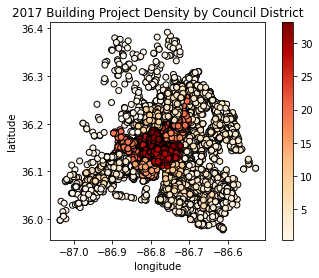

In [83]:
# Create choropleth plot
districts_and_permits.plot(column = 'permit_density', cmap = 'OrRd', edgecolor = 'black', legend = True)

# Add axis labels and title
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.title('2017 Building Project Density by Council District')
plt.show()

## 4.8. Choropleths with folium

In this exercise, you will construct a folium choropleth to show the density of permitted construction projects in different Nashville council districts. You will be using a single data source, the `districts_and_permits` GeoDataFrame, which has been pre-loaded for you.

---
1. Create a map object `m` using the `nashville` point for `location` and a `zoom_start` of 10.

2. 

- Use `districts_and_permits`: `geometry` for polygons, `district` & `permit_density` to color. Use `Reds` and `0.5` opacity for the fill; Set line_opacity to `1.0`.
- Set `key_on` to `feature.properties.district`. Use the title provided.

3. Next create and add a folium `LayerControl()`. `display` the map.

In [85]:
#1.  Center point for Nashville
nashville = [36.1636,-86.7823]

#1.  Create map
m = folium.Map(location=nashville, zoom_start=10)


# 2. Build choropleth
# m.choropleth(
#     geo_data=districts_and_permits,
#     name='geometry',
#     data=districts_and_permits,
#     columns=['district', 'permit_density'],
#     key_on='feature.properties.district',
#     fill_color='Reds',
#     fill_opacity=0.5,
#     line_opacity=1.0,
#     legend_name='2017 Permitted Building Projects per km squared'
# ) # m.choropleth deprecating, see updated code below

folium.Choropleth(
    geo_data=districts_and_permits,
    name='geometry',
    data=districts_and_permits,
    columns=['district', 'permit_density'],
    key_on='feature.properties.district',
    fill_color='Reds',
    fill_opacity=0.5,
    line_opacity=1.0,\
    legend_name='2017 Permitted Building Projects per km squared'
    ).add_to(m)

# 3. Create LayerControl and add it to the map            
folium.LayerControl().add_to(m)

# 3. Display the map
display(m)   

## 4.9. Folium choropleth with markers and popups
Now you will add a marker to the center of each council district that shows the district number along with the count of building permits issued in 2017 for that district. The map you created in the last exercise is available as `m`.

---

- Find the centroid for each council district and store it in a new column, `center` in the `districts_and_permits` GeoDataFrame.

- Iterate through `districts_and_permits` and add a marker at each district's `center`. Remember to reverse the coordinate pair.

- Create popups within your for loop to display the district number and the count of permits issued.

- Add the markers to your map with `.add_to()` and display it.

In [87]:
districts_and_permits.shape

(10775, 18)

In [88]:
districts_and_permits_resized=districts_and_permits.loc[0:30,:]

In [89]:
districts_and_permits_resized.shape

(31, 18)

In [ ]:
# Create center column for the centroid of each district
# districts_and_permits['center'] = districts_and_permits.geometry.centroid
districts_and_permits_resized['center'] = districts_and_permits_resized.geometry.centroid
# Build markers and popups
for row in districts_and_permits_resized.iterrows():
    row_values = row[1] 
    center_point = row_values['center']
    location = [center_point.y, center_point.x]
    popup = ('Council District: ' + str(row_values['district']) + 
             ';  ' + 'permits issued: ' + str(row_values['bldg_permits']))
    marker = folium.Marker(location = location, popup = popup)
    marker.add_to(m)
    
# Display the map
display(m)

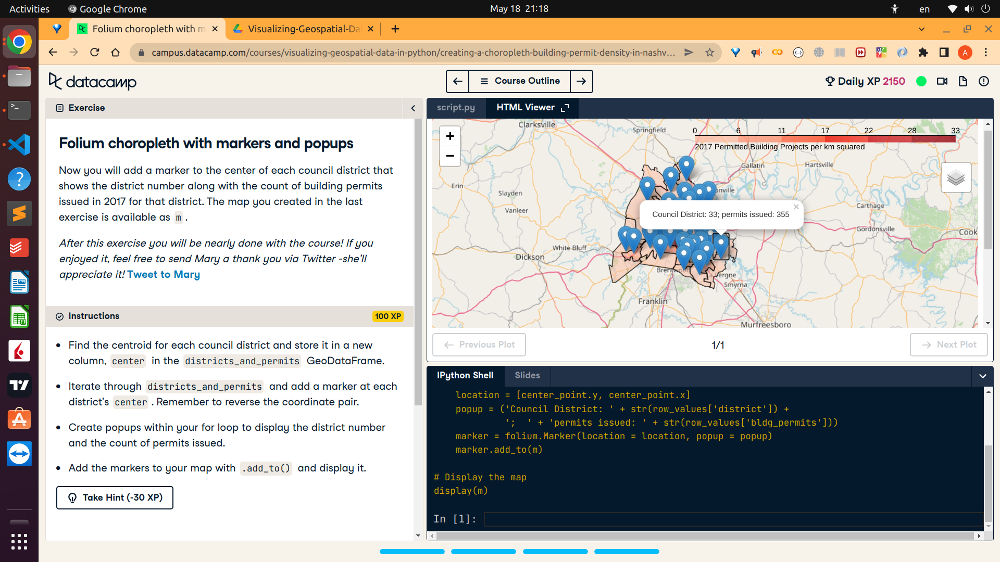